In [1]:

import phd_ms
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

In [2]:

#Change this line to the directory where inputs are stored
IN_DIR = '/home/pbeamer/Documents/graphst/'

DATASET = 'adata_151673'
emb = 'X_gst'
INPUT_FILE= IN_DIR+DATASET+'_gst_1'

#Set the scale parameters we want to use, and keys to save
RESOLUTIONS = np.linspace(start=0.15,stop=.95,num=8)
RES_KEYS = ['leiden_'+str(r) for r in RESOLUTIONS]
GROUND_TRUTH = 'cluster'


In [3]:

#Run clusterings for each resolution and save
'''
Preprocess leiden clusterings for given dataset

Arguments: 
input_file: path to the input file
output_file: is the path where the output will be saved
embedding: anndata field of the embedding to use
resolutions: Resolution parameters
keys = Keys to save clusters in adata.obs
ground_truth: The ground truth field in adata.obs

Output: adata with clusters in adata.obs[keys[i]] for each resolution i
'''
phd_ms.tl.preprocess_leiden(INPUT_FILE,output_file=INPUT_FILE,emb='X_gst',resolution=RESOLUTIONS,res_keys=RES_KEYS,ground_truth=GROUND_TRUTH)

#read the adata file
adata = sc.read_h5ad(INPUT_FILE+'.h5ad')

In [4]:
'''
Build cluster filtration

Arguments: 
input_file: path to the input file
output_file: is the path where the output will be saved
embedding: anndata field of the embedding to use
resolutions: Resolution parameters
keys = Keys to save clusters in adata.obs
ground_truth: The ground truth field in adata.obs

Output: adata with clusters in adata.obs[keys[i]] for each resolution i
'''
cluster_complex,clusterings= phd_ms.tl.cluster_filtration(adata,res_keys=RES_KEYS,index='containment',order=range(len(RES_KEYS)),)


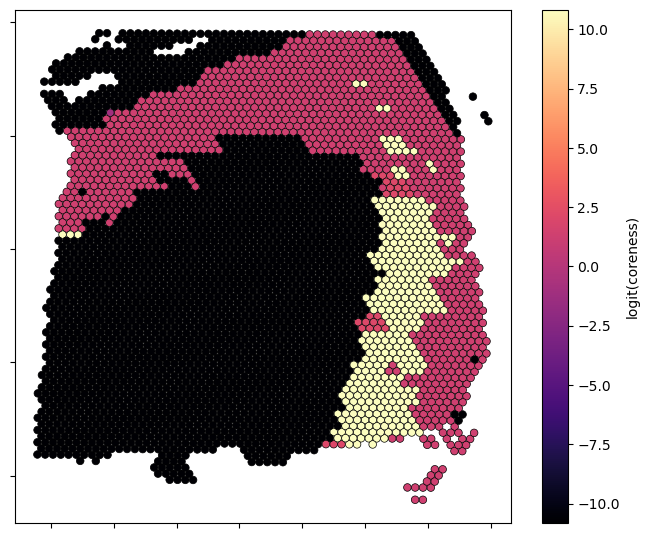

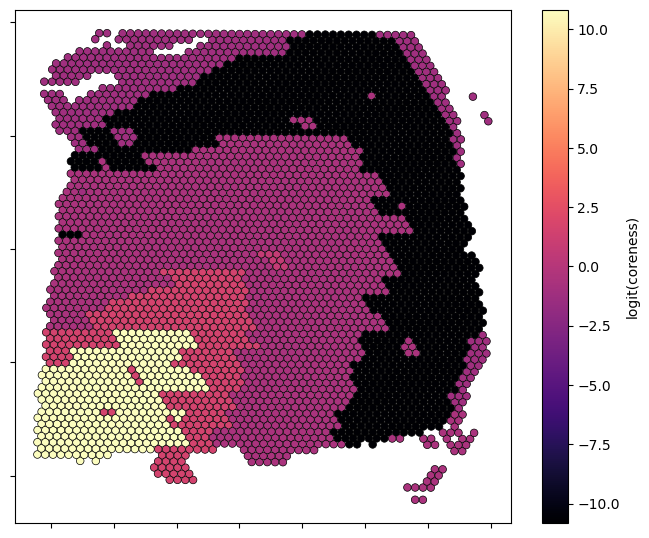

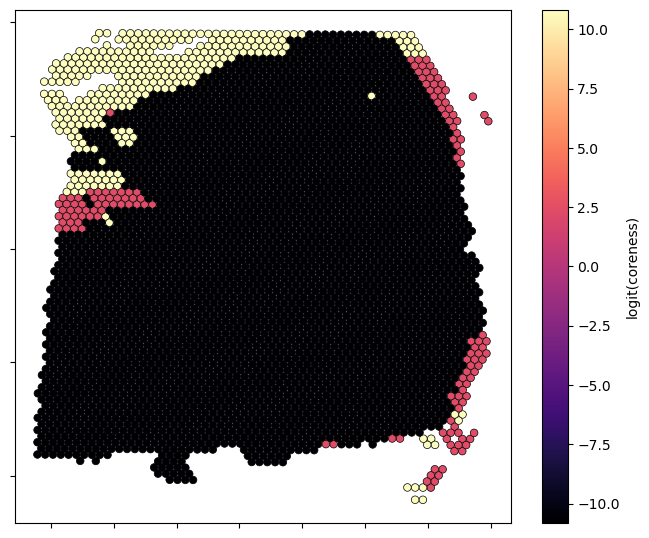

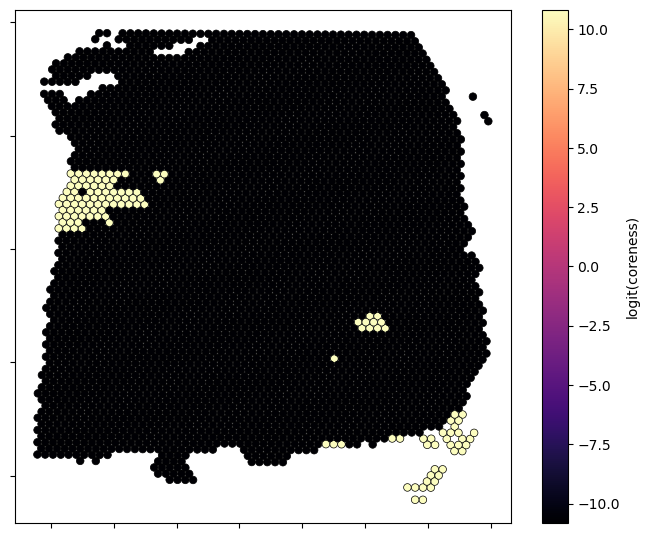

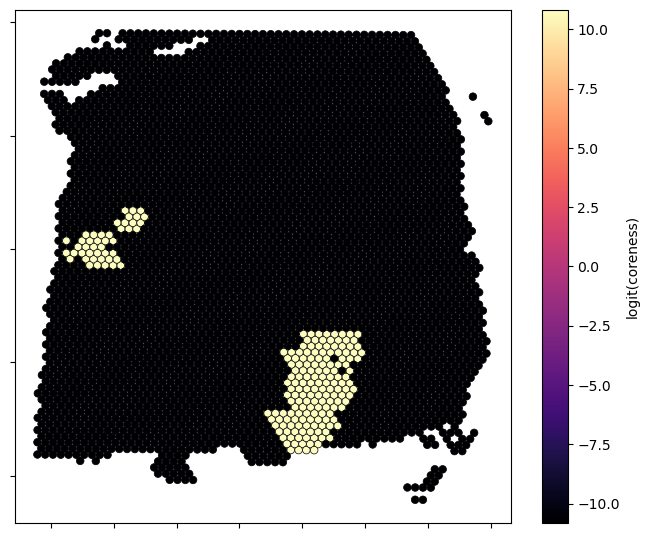

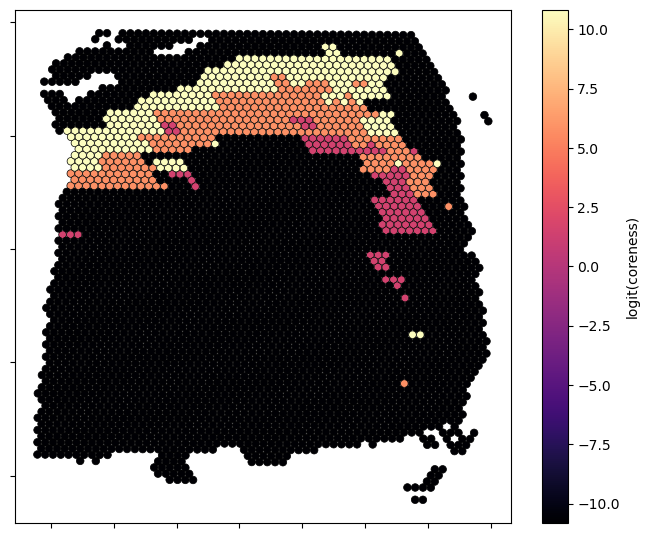

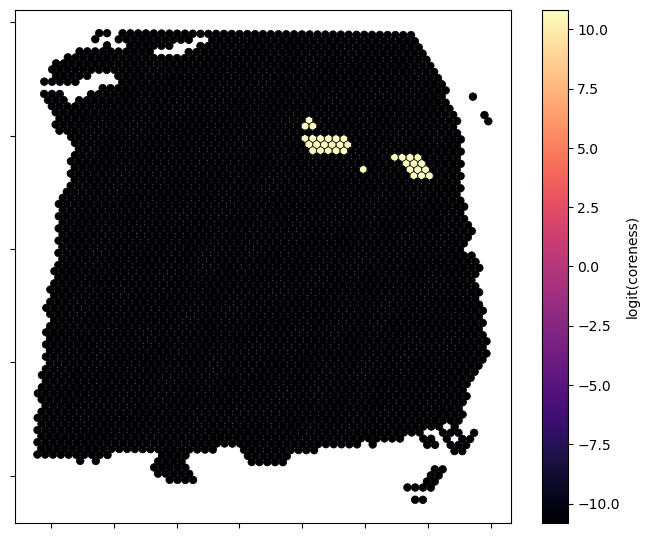

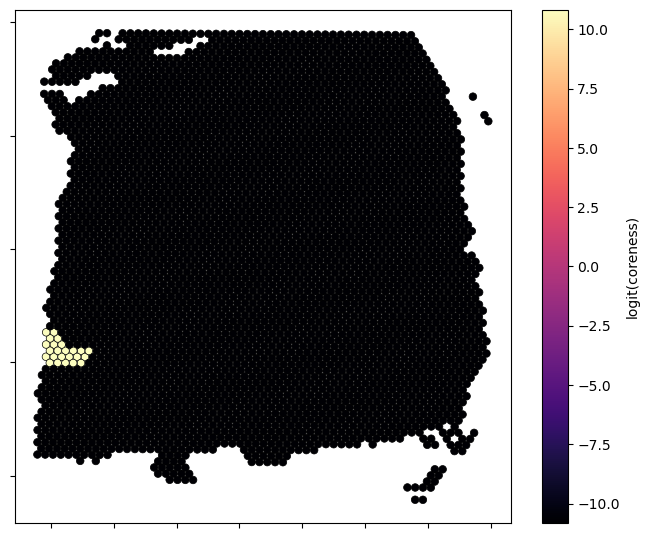

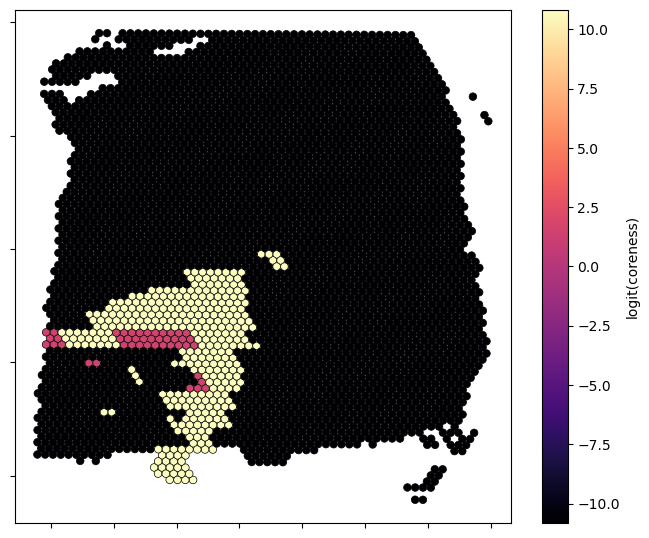

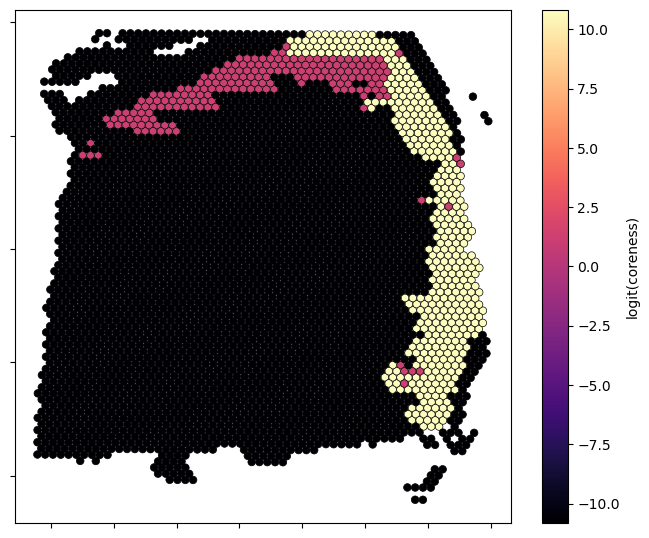

array([[0.78473993, 0.        , 0.        , ..., 0.        , 0.        ,
        1.        ],
       [0.        , 0.24209215, 1.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 1.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.82191781, 0.        , ..., 0.        , 1.        ,
        0.        ],
       [0.        , 0.82191781, 0.        , ..., 0.        , 1.        ,
        0.        ],
       [0.78473993, 0.        , 0.        , ..., 0.        , 0.        ,
        0.76406396]], shape=(3639, 10))

In [5]:

'''
Generate and map multiscale domains

Arguments:
spatial: spatial coordinates of points
cluster_complex: gudhi simplex tree of cluster filtration
clusterings: list of clusters at each resolution, containing cell indices
num_domains: number of multiscale domains to map, if 0 then all domains
filt: filter out persistent clusters with persistence less than this value
order: order of the output,'size' or default 'persistence'
redundant_filter: filter out domains which are to similar to previously examined domains, default is False
plots: 'on' to plot the domains

Output:
list of multiscale domains, consisting of coreness score for each point
'''
phd_ms.tl.map_multiscale(adata.obsm['spatial'],cluster_complex,clusterings,num_domains=10,filt=0.1,order='persistence',redundant_filter=.5,plots='on')


Wasserstein distance, index of optimal multiscale domain:
(np.float64(10.178406770568797), 22)
(np.float64(25.820256599835147), 29)
(np.float64(12.638555429354168), 0)
(np.float64(26.883228141987043), 42)
(np.float64(11.696943584322396), 42)
(np.float64(14.691305397102747), 64)
(np.float64(7.08056100445897), 82)


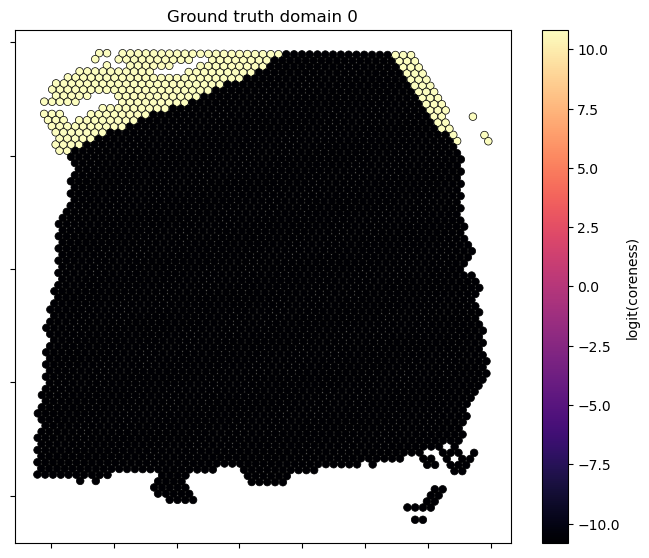

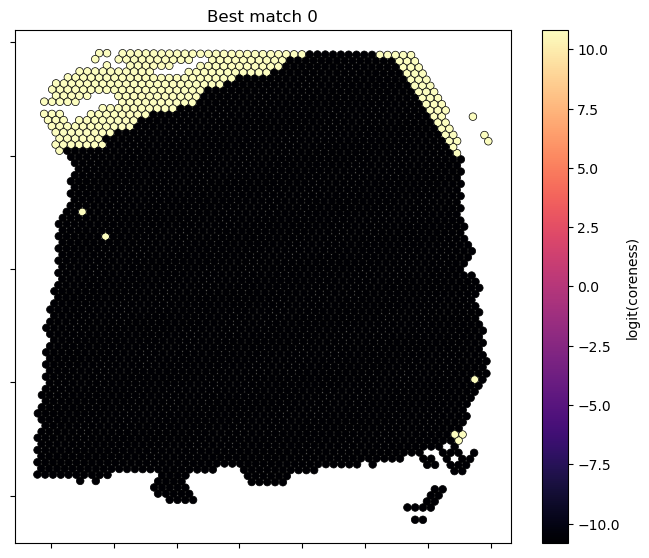

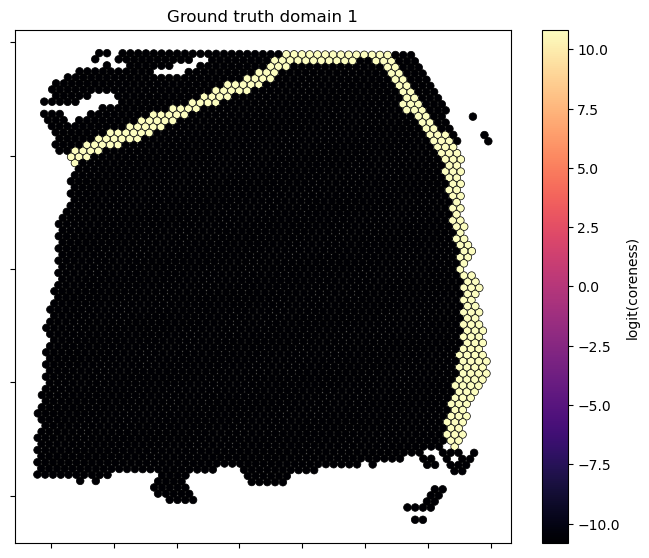

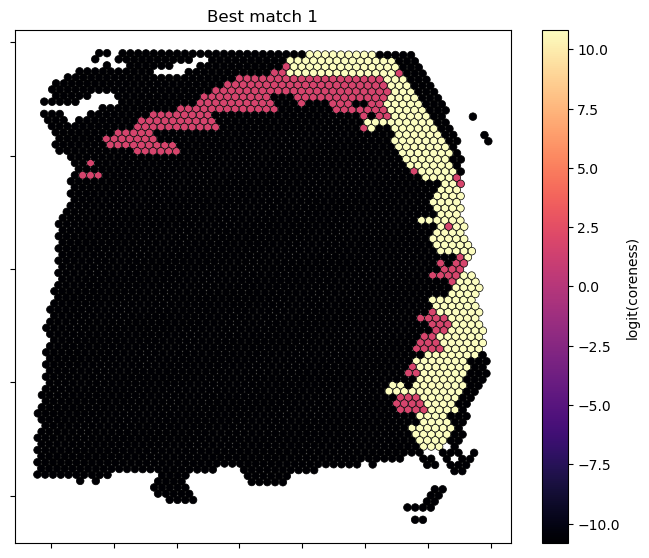

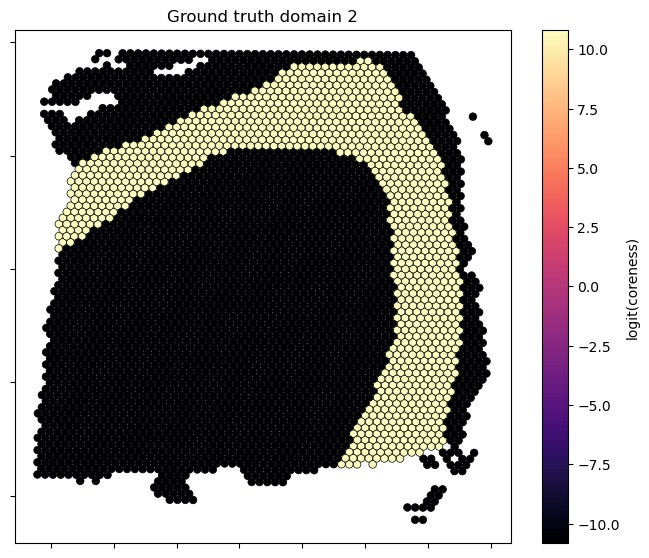

...

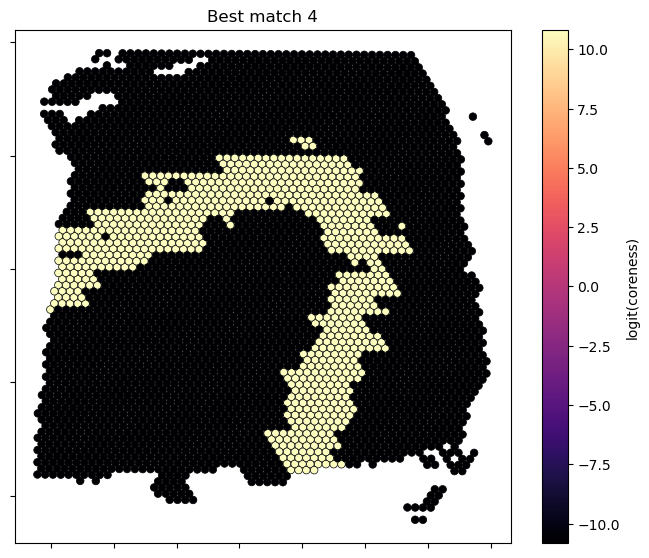

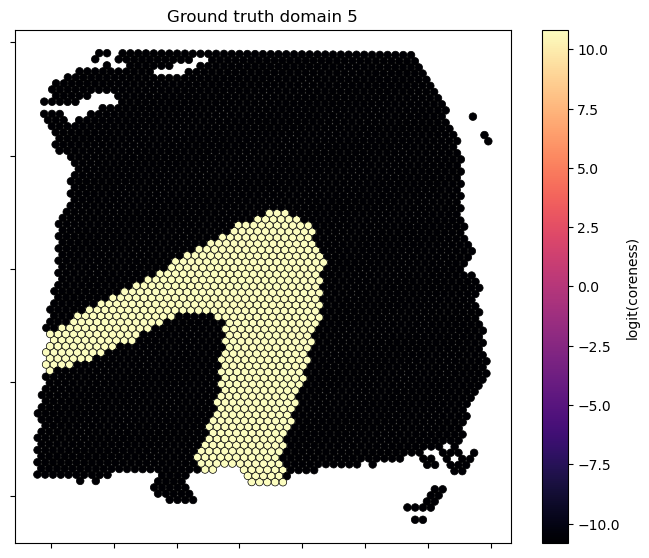

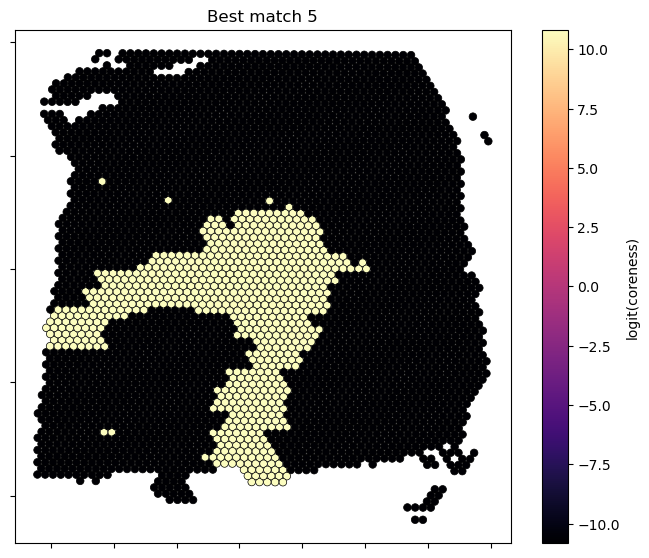

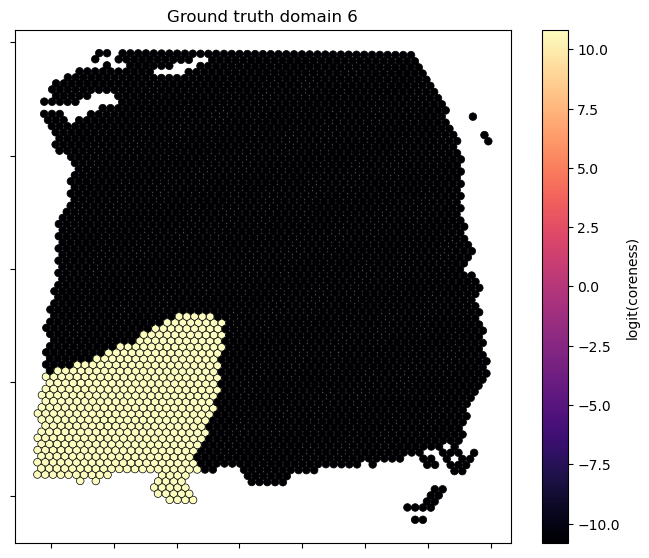

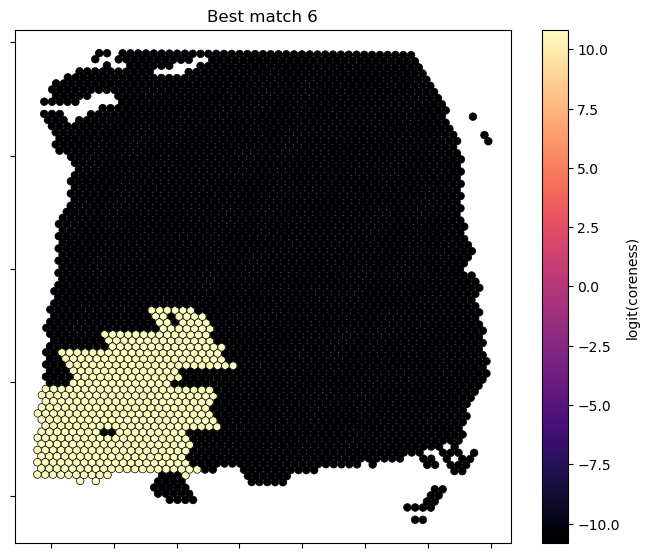

In [6]:
'''
Compute wasserstein distance between ground truth and multiscale domains

Arguments:
ground truth: ground_truth clustering
multiscale: matrix of coreness scores for each multiscale domain
spatial: spatial coordinates
plots: whether to plot matching ground truth and multiscale domains

Output:
costs: wasserstein costs (nondimensional)
m: maximum distance between spots (units of spatial coordinates)
'''

adata.obsm['multiscale']= phd_ms.tl.map_multiscale(adata.obsm['spatial'],cluster_complex,clusterings,num_domains=0,filt=0,order='persistence',redundant_filter=False,plots='off')
costs,m = phd_ms.tl.ground_truth_benchmark(adata.obs[GROUND_TRUTH],adata.obsm['multiscale'],adata.obsm['spatial'],plots=True)


Wasserstein distance, index of optimal multiscale domain:
(np.float64(10.178406770568797), 3)
(np.float64(38.273512524108114), 0)
(np.float64(13.491796029702202), 0)
(np.float64(52.182313446160364), 1)
(np.float64(22.1451463636031), 1)
(np.float64(44.93149974057269), 1)
(np.float64(16.519389156825174), 2)


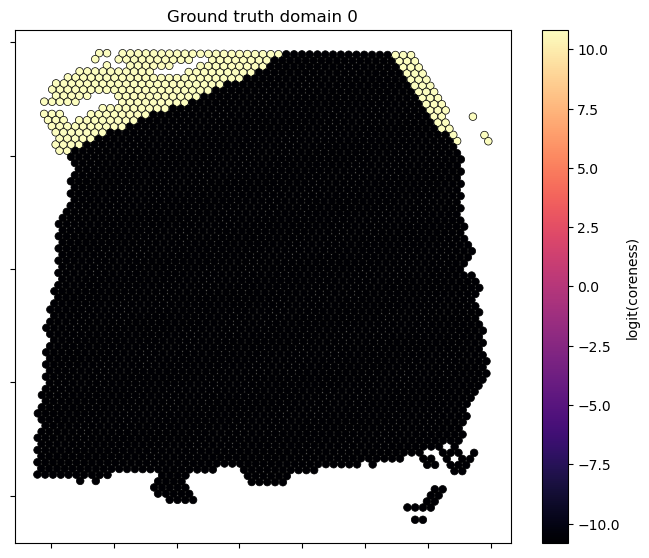

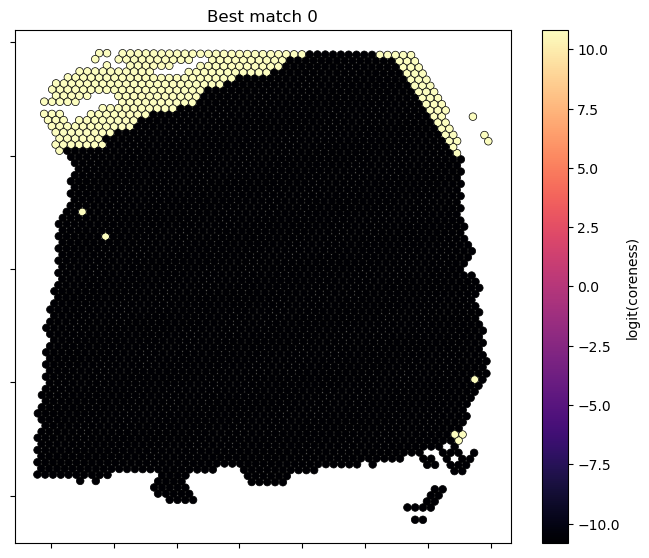

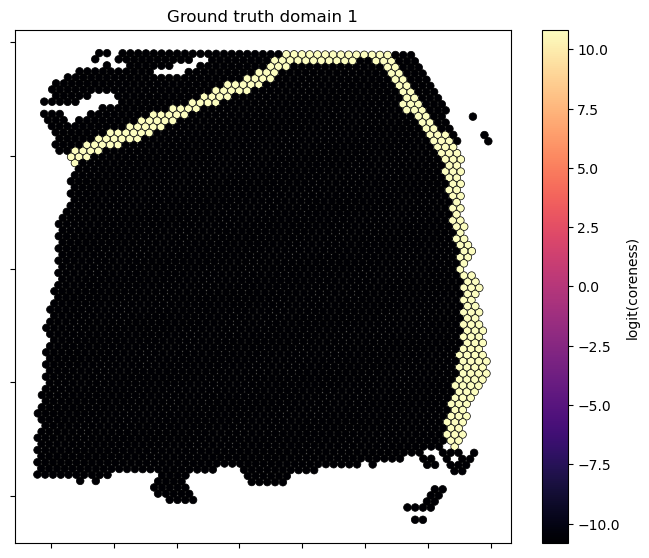

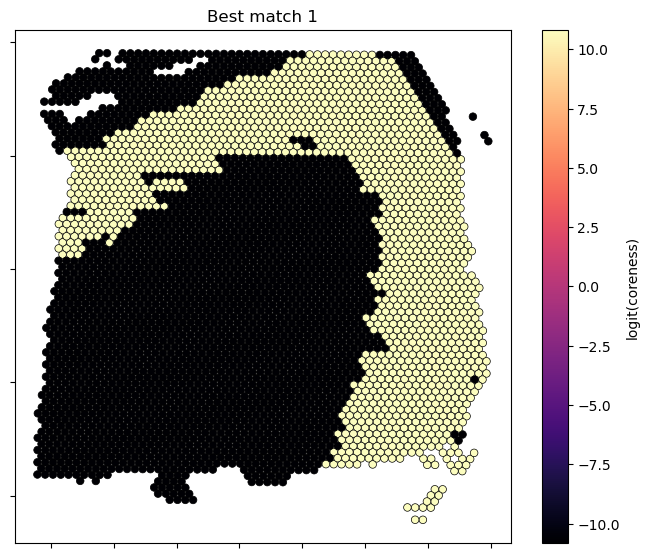

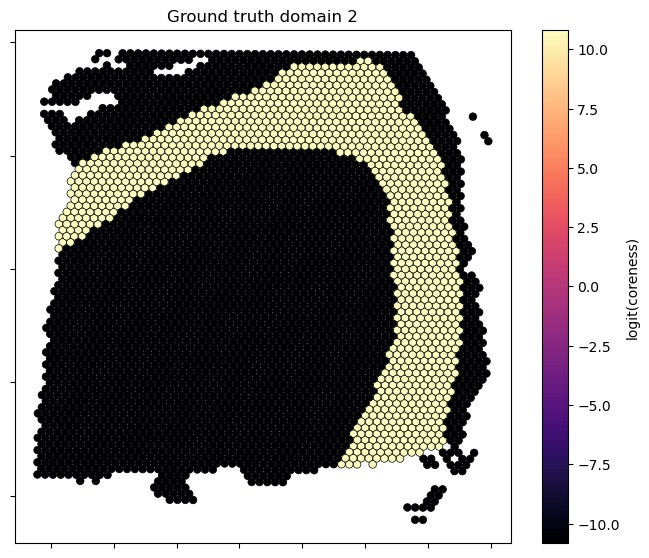

...

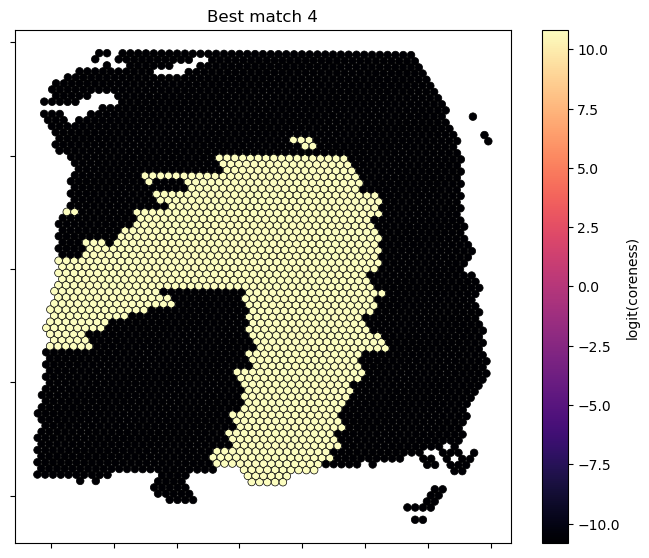

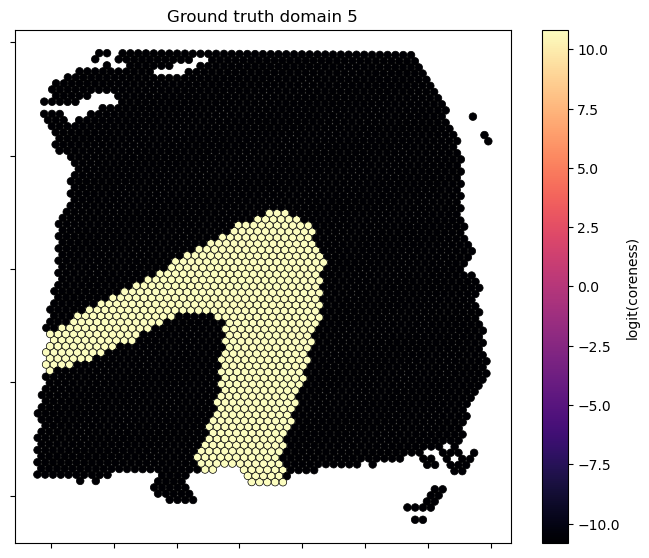

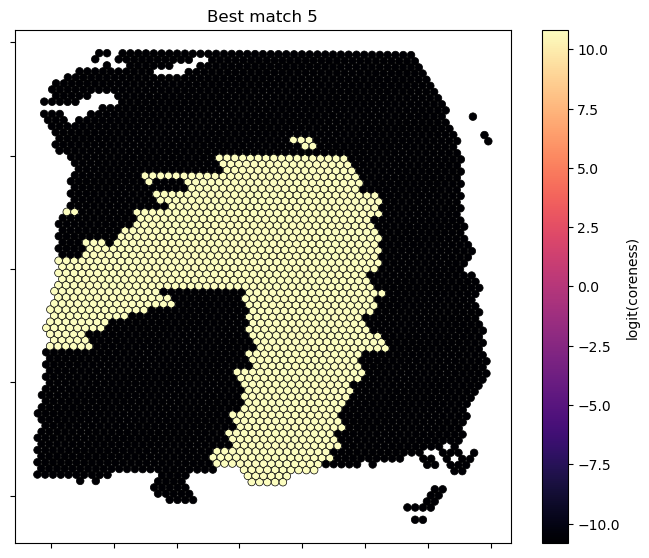

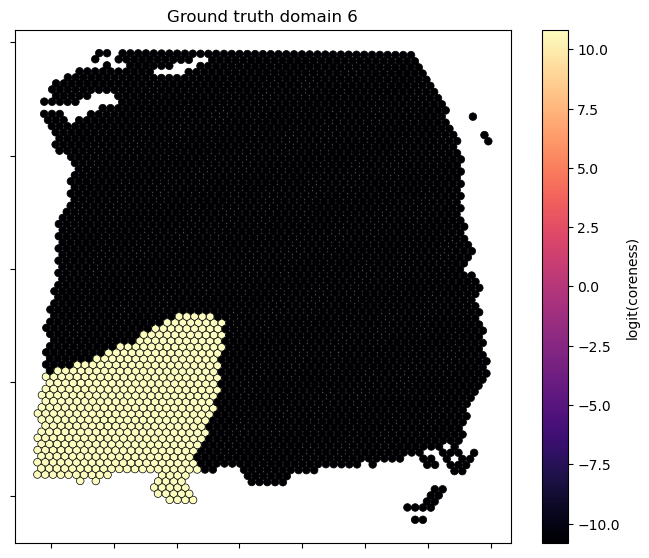

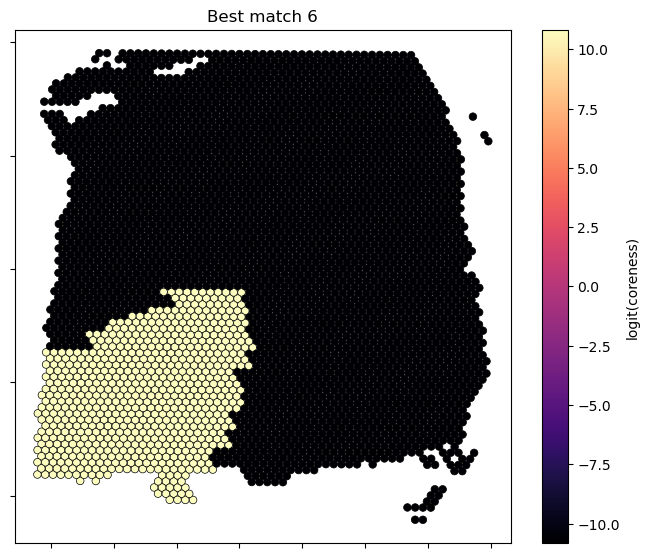

In [7]:

#compare against single scale which best matches ground truth number of clusters

#Pick the resolution which best matches the ground truth number of clusters
r = np.argmin(list(abs(len(adata.obs[GROUND_TRUTH].cat.categories.to_list()) - len(adata.obs[key]))) for key in RES_KEYS)
r = RES_KEYS[r]
#Convert to distribution
costs,m = phd_ms.tl.ground_truth_benchmark(adata.obs[GROUND_TRUTH],adata.obs[r],adata.obsm['spatial'],plots=True)
